In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from pandas.api.types import is_numeric_dtype
import plotly.express as px
import seaborn as sn
import os

In [9]:
path = "C:\\Users\\mateo\\OneDrive - INSTITUTO TECNOLOGICO AUTONOMO DE MEXICO\\cobi_data\\"


In [13]:
# read the csv file
df = pd.read_csv(path + 'Avisos_arribo_Baja_California_2017-2021.csv', encoding="latin1")

# Estandarizamos las columnas:
df.columns = df.columns.str.strip() # Leading and trailing
df.columns = df.columns.str.lower()
df.columns = df.columns.str.replace(" ", "_")
df.columns
for c in df.columns:
    df[c] = df[c].replace(",", "")
    
# Cambiamos a numericos y a fechas los necesarios:
l_num = ["peso_vivo", "peso_desembarcado", "precio", "valor"]
l_date = ["fecha_aviso", "fecha_expedicion", "fecha_vigencia", "periodo_inicio", "periodo_fin"] # ¡revisar fechas en otro formato!
for col in l_num:
    df[col] = pd.to_numeric(df[col].str.replace(",",""))
for col in l_date:
    df[col] = pd.to_datetime(df[col], infer_datetime_format=True, errors='coerce')

# Agregamos mes-año y año como columnas:
df["mes_fin"] = df.periodo_fin.dt.month
df["anio_fin"] = df.periodo_fin.dt.year

df["anio_mes_fin"] = df.apply(lambda x: str(x["anio_fin"]).replace(".0","") + "-" + str(x["mes_fin"]).replace(".0","")
                              if (x["mes_fin"] != np.nan) and (x["anio_fin"] != np.nan)
                              else np.nan, axis=1)
print(df.columns)
print("-------\n Info: ")
df.info()

Index(['RNP ACTIVO', 'NOMBRE ACTIVO', 'CLAVE SITIO DESEMBARQUE',
       'NOMBRE SITIO DESEMBARQUE', 'RNPA UNIDAD ECONOMICA', 'UNIDAD ECONOMICA',
       'NOMBRE ESTADO', 'CLAVE OFICINA', 'NOMBRE OFICINA', 'TIPO AVISO',
       'FOLIO AVISO', 'FECHA AVISO', 'ORIGEN', 'CLAVE LUGARCAPTURA',
       'NOMBRE LUGARCAPTURA', 'NUMERO EMBARCACIONES', 'MES CORTE', 'AÑO CORTE',
       'PERIODO INICIO', 'PERIODO FIN', 'DURACION', 'DIAS EFECTIVOS',
       'TIPO ZONA', 'PRODUCCION ACUACULTURAL', 'NUMERO PERMISO',
       'FECHA EXPEDICION', 'FECHA VIGENCIA', 'NOMBRE PRINCIPAL',
       'CLAVE ESPECIE', 'ESPECIE', 'PESO DESEMBARCADO', 'PESO VIVO', 'PRECIO',
       'VALOR', 'LITORAL'],
      dtype='object')
Index(['rnp_activo', 'nombre_activo', 'clave_sitio_desembarque',
       'nombre_sitio_desembarque', 'rnpa_unidad_economica', 'unidad_economica',
       'nombre_estado', 'clave_oficina', 'nombre_oficina', 'tipo_aviso',
       'folio_aviso', 'fecha_aviso', 'origen', 'clave_lugarcaptura',
       'nombre_lu

In [16]:
df.describe()

,rnp_activo,nombre_activo,clave_sitio_desembarque,rnpa_unidad_economica,clave_oficina,clave_lugarcaptura,numero_embarcaciones,año_corte,duracion,dias_efectivos,peso_desembarcado,peso_vivo,precio,valor
count,0.0,0.0,9.745500e+04,9.745500e+04,97455.000000,9.745500e+04,9.745500e+04,97455.000000,9.745500e+04,97455.000000,9.745500e+04,9.745500e+04,97455.000000,9.745500e+04
mean,NaN,NaN,2.043228e+05,2.041962e+08,204.144795,3.055030e+05,2.106545e+04,2019.184526,-5.965177e+08,9.647417,1.004736e+03,1.306997e+03,82.873844,3.791890e+04
std,NaN,NaN,2.639388e+04,3.747140e+07,2.558387,8.707774e+05,6.454145e+06,1.415485,1.674019e+11,2128.224051,9.539817e+03,1.067968e+04,198.885657,2.294822e+05
min,NaN,NaN,2.006010e+05,2.020004e+08,201.000000,2.006010e+05,0.000000e+00,2017.000000,-2.000000e+13,0.000000,1.000000e-02,0.000000e+00,0.300000,1.000000e+00
25%,NaN,NaN,2.020380e+05,2.030090e+08,202.000000,2.020390e+05,2.000000e+00,2018.000000,0.000000e+00,1.000000,7.000000e+01,6.697500e+01,15.000000,2.250000e+03
50%,NaN,NaN,2.030130e+05,2.030140e+08,203.000000,2.030190e+05,3.000000e+00,2019.000000,2.000000e+06,2.000000,2.400000e+02,2.500000e+02,25.000000,8.000000e+03
75%,NaN,NaN,2.070010e+05,2.031270e+08,206.000000,2.071040e+05,6.000000e+00,2020.000000,2.000000e+06,3.000000,7.480000e+02,8.010000e+02,65.000000,2.790000e+04
max,NaN,NaN,3.107001e+06,3.107000e+09,210.000000,8.888888e+06,2.014712e+09,2021.000000,2.000000e+13,664379.000000,2.766427e+06,2.766427e+06,24244.900000,5.195744e+07


In [19]:
# Histogramas de las columnas numéricas interesantes:
rango = [.25,.75]
width = 600
for col in ["peso_desembarcado", "peso_vivo", "precio", "valor"]:
    qs = [np.quantile(df[col], rango[0]), np.quantile(df[col], rango[1])]
    dist = np.quantile(df[col], rango[0]) - np.quantile(df[col], rango[1])
    fences = [qs[0] - (1.5*dist), qs[1] + (1.5*dist)]
    aux = df[(df[col] > qs[0]) & (df[col] < qs[1])]
    if is_numeric_dtype(aux[col]):
        fig = px.histogram(aux, x=col)
        fig.update_layout(
            width=width,  # set the width of the figure in pixelsa
        )
        fig.show()
        fig = px.box(aux, y=col)
        fig.update_layout(
            width=width,  # set the width of the figure in pixels
        )
        fig.show()
        fig = px.box(df, y=col)
        fig.update_layout(
            width=width,  # set the width of the figure in pixels
        )
        fig.show()

In [20]:
# Distribución de pesos desembarcados por fechas (promedio por día):
granularidad = "periodo_fin" # días
fecha = "periodo_fin"
aux = df
mediana = aux["peso_desembarcado"].median()
print(mediana)

aux = df[(df[fecha] > '2010') & (df[fecha] <= '2023')]
aux = aux[aux["peso_desembarcado"] < mediana]

aux = aux.groupby("periodo_fin").mean()["peso_desembarcado"]
aux = pd.DataFrame(aux).reset_index()
fig = px.scatter(aux, x=fecha, y="peso_desembarcado")
fig.update_layout(width=700)
fig.show()

# Distribución de pesos vivos por fechas (promedio por día):
aux = df
mediana = aux["peso_vivo"].median()
print(mediana)

aux = df[(df[fecha] > '2010') & (df[fecha] <= '2023')]
aux = aux[aux["peso_vivo"] < mediana]

aux = aux.groupby(granularidad).mean()["peso_vivo"]
aux = pd.DataFrame(aux).reset_index()
fig = px.scatter(aux, x=granularidad, y="peso_vivo")
fig.update_layout(width=700)
fig.show()

# Comentarios: Se notan mínimos al rededor de los meses de abril y mayo cada año

240.0


C:\Users\mateo\AppData\Local\Temp\ipykernel_3636\1972170484.py:11: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



250.0


C:\Users\mateo\AppData\Local\Temp\ipykernel_3636\1972170484.py:25: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [22]:
# Distribución de pesos desembarcados por fechas (promedio por mes):

granularidad = "anio_mes_fin" # meses
fecha = "periodo_fin"
aux = df
mediana = aux["peso_desembarcado"].median()
print(mediana)

aux = aux[(aux[fecha] > '2010') & (aux[fecha] <= '2023')]
aux = aux[aux["peso_desembarcado"] < mediana]

aux = aux.groupby(granularidad).mean()["peso_desembarcado"]
aux = pd.DataFrame(aux).reset_index()
fig = px.bar(aux, x=granularidad, y="peso_desembarcado")
fig.update_yaxes(range = [60,110])
fig.update_layout(width=700)
fig.show()

# Distribución de pesos vivos por fechas (promedio por día):
aux = df
mediana = aux["peso_vivo"].median()
print(mediana)

aux = aux[(aux[fecha] > '2010') & (aux[fecha] <= '2023')]
aux = aux[aux["peso_vivo"] < mediana]

aux = aux.groupby(granularidad).mean()["peso_vivo"]
aux = pd.DataFrame(aux).reset_index()
fig = px.bar(aux, x=granularidad, y="peso_vivo")
fig.update_yaxes(range = [60,110])
fig.update_layout(width=700)
fig.show()

# Comentarios: Se confirma la baja pesca global en los meses en torno a abril y mayo desde 2017, y una baja 
# considerable a partir de 2021 probablemente por la pandemia. Vale la pena revisar qué condiciones climatológicas
# y del mar se presentan en estas temporadas. 
# Hay que hacer un análisis análogo con los meses con más pesca. Aquí no aparecen porque
# estamos viendo los que están por debajo de la mediana. 

240.0


C:\Users\mateo\AppData\Local\Temp\ipykernel_3636\3287741896.py:12: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



250.0


C:\Users\mateo\AppData\Local\Temp\ipykernel_3636\3287741896.py:27: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<AxesSubplot:>

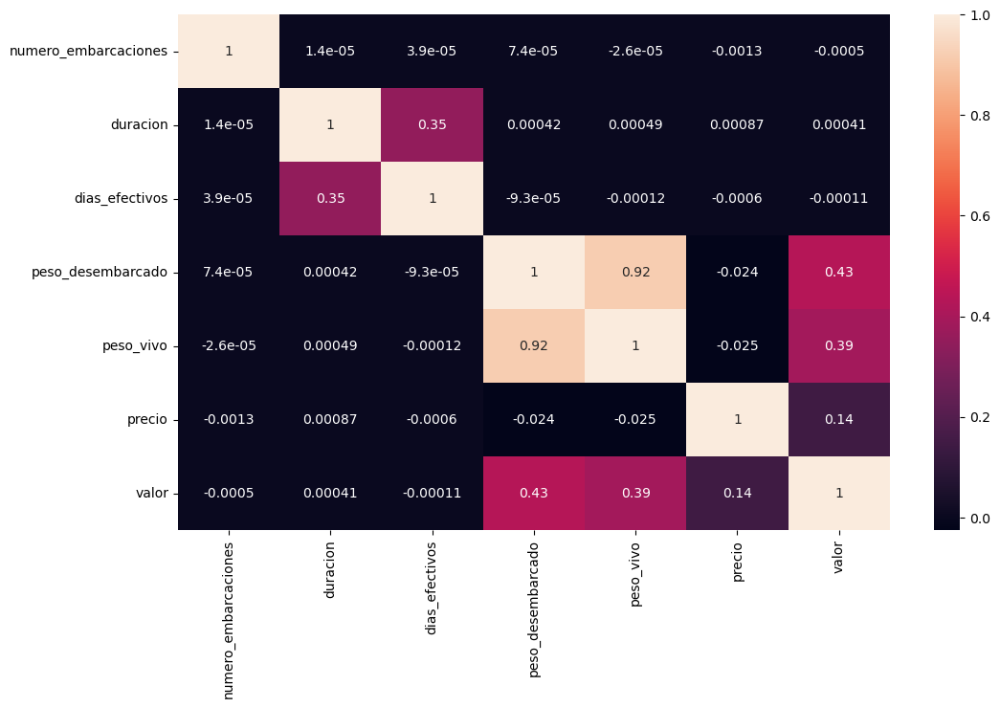

In [123]:
# Heatmap para encontrar posibles correlaciones:

fig, ax = plt.subplots(figsize = (12, 7))

corr = df[["numero_embarcaciones", "duracion", "dias_efectivos", "peso_desembarcado", "peso_vivo", "precio", "valor"]].corr()
sn.heatmap(corr, annot = True)

# Comentarios: la única variable que más o menos se correlaciona con el peso desembarcado es el valor.

In [230]:
# Análisis por especie: 
print("Hay", len(set(df.especie)),"especies diferentes y", len(set(df.clave_especie)), "claves diferentes")
print("Hay", len(set(df.nombre_principal)), "nombres diferentes")

# Análisis por nombre (debemos verificar que cada especie diferente registrada es única, mientras usaremos el nombre para agrupar):
aux = df.head(500)
aux.drop(aux[aux["anio_mes_fin"] == "nan-nan"].index, inplace = True)
aux.anio_mes_fin = pd.to_datetime(aux.anio_mes_fin)
aux = aux[(aux[fecha] > '2010') & (aux[fecha] <= '2023')]

aux = aux.groupby(["anio_mes_fin", "nombre_principal"]).mean()["peso_desembarcado"]
aux = pd.DataFrame(aux).reset_index().sort_values("nombre_principal").sort_values("anio_mes_fin")

fig = px.line(aux, x="anio_mes_fin", y="peso_desembarcado", color='nombre_principal')
fig.show()

# Comentaios: Incluso con sólo 50 nombres el análisis temporal por especie se satura, debemos encontrar otra manera de 
# analizar cada especie


Hay 541 especies diferentes y 542 claves diferentes
Hay 48 nombres diferentes


C:\Users\javi2\AppData\Local\Temp\ipykernel_7456\2106803461.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\javi2\AppData\Local\Temp\ipykernel_7456\2106803461.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

